# Подбиране на настройки за модела

keras-retinanet ни предоставя инструменти, с които можем да проверим дали тренировъчните данни са анотирани правилно. Също така, можем да видим кои са опорните bounding box-ове (в жълт цвят). Корабите, които са оградени в червено са с размер, който възпрепятства засичането им, с използваните настройки на алгоритъма за опорни bounding box-ове. Данните за тези кораби просто ще се изхвърлят от алгоритъма. Корабите, около които има зелени и жълти box-ове ще се засекат от модела. Зелените box-ове показват bounding box-овете от анотациите.

Нека първо разгледаме картинките с настройките на модела по подразбиране

Using TensorFlow backend.


Image ../data/train_v2/89c428510.jpg


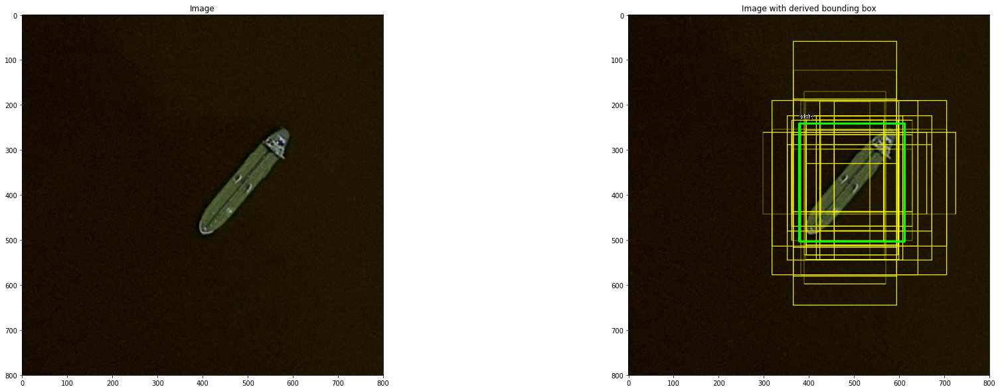

Image ../data/train_v2/aec367d77.jpg


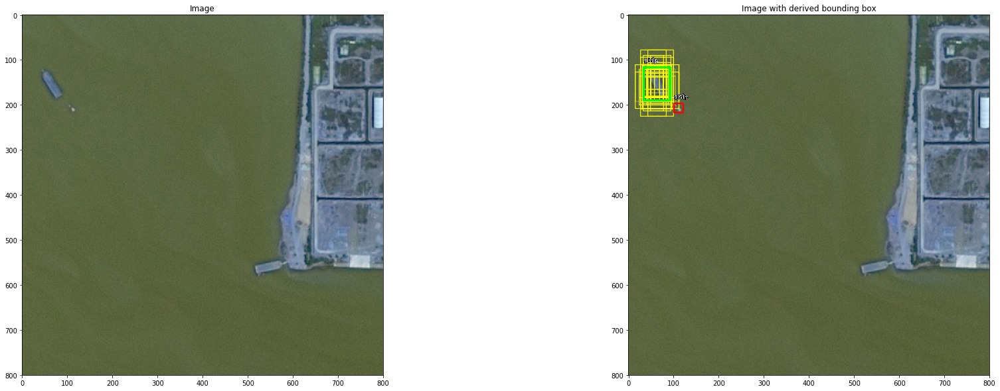

Image ../data/train_v2/9c9d84825.jpg


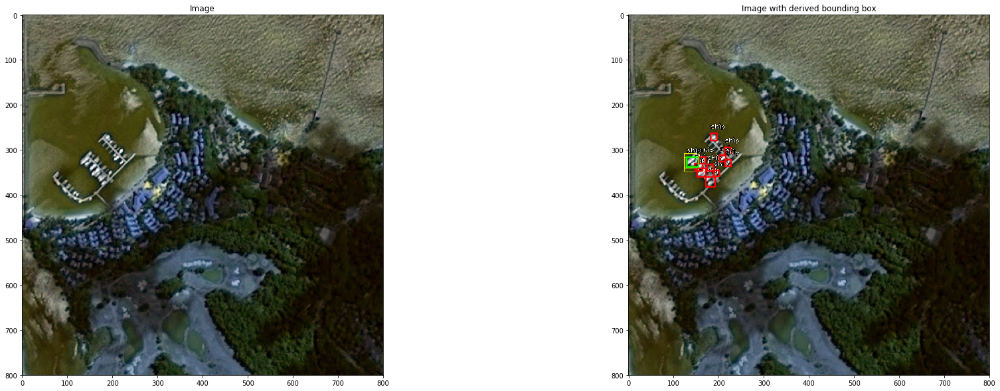

Image ../data/train_v2/07f5077e4.jpg


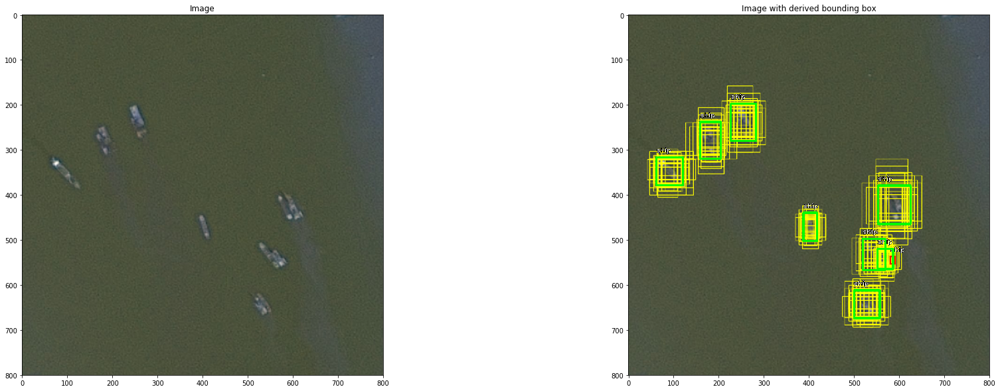

Image ../data/train_v2/4a46b4c0c.jpg


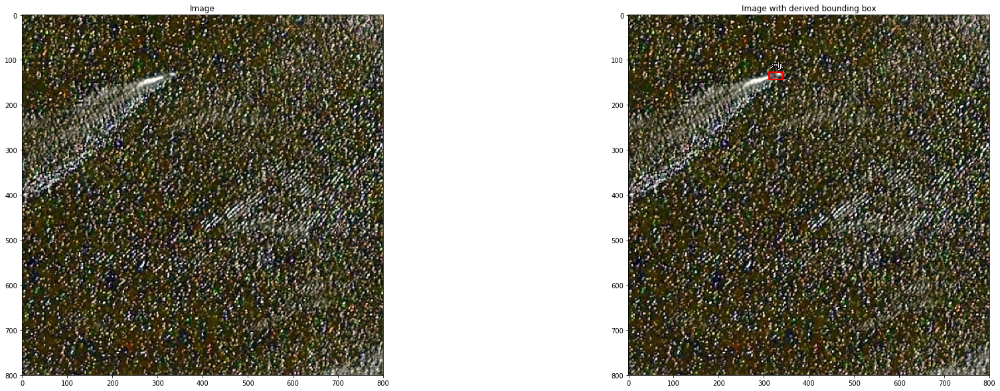

Image ../data/train_v2/559eeffea.jpg


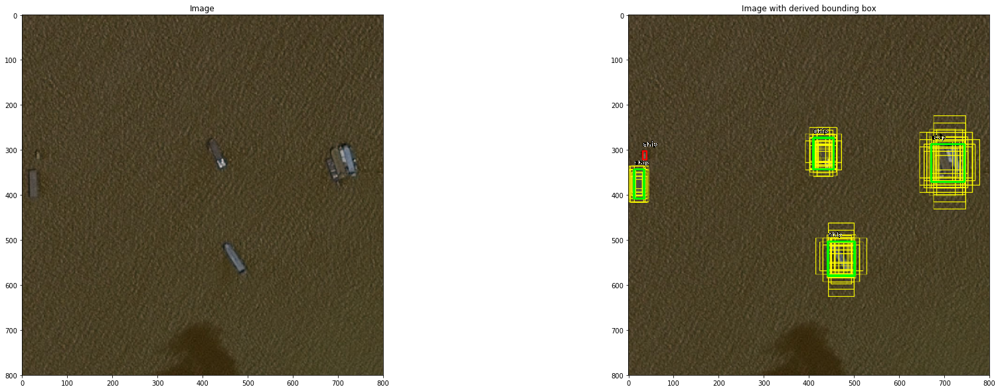

Image ../data/train_v2/c88114242.jpg


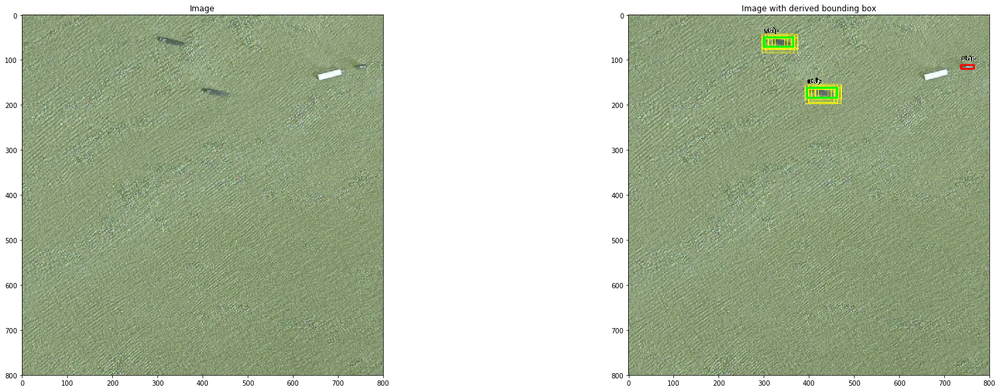

Image ../data/train_v2/c0c617b6d.jpg


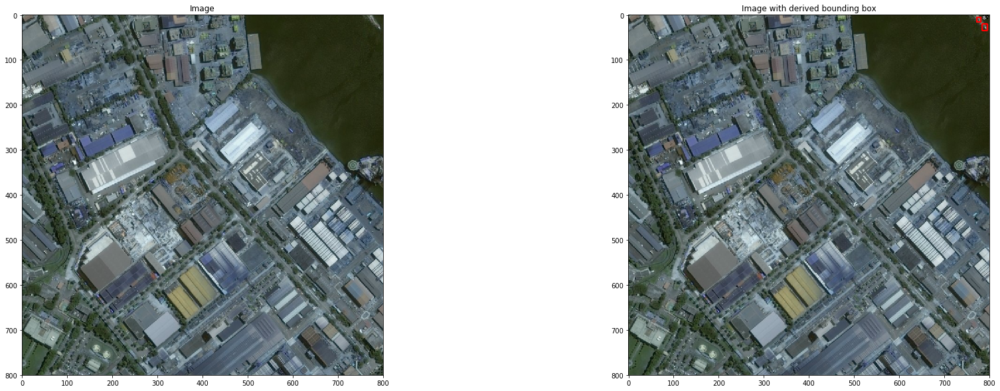

Image ../data/train_v2/c87e98339.jpg


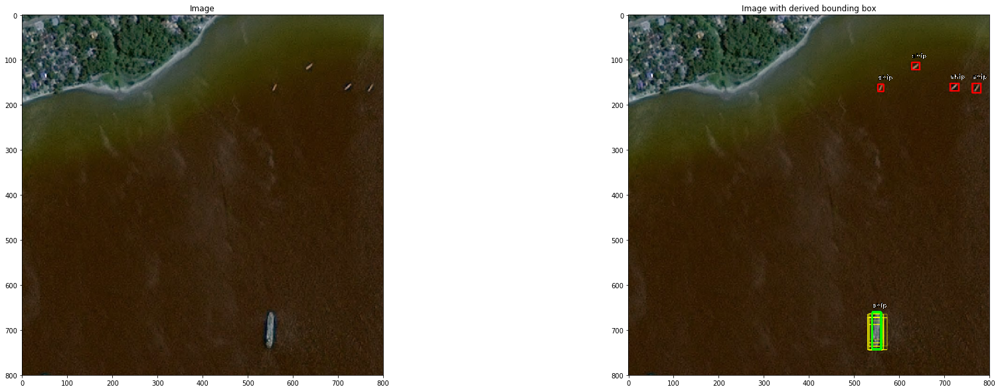

Image ../data/train_v2/3f33be256.jpg


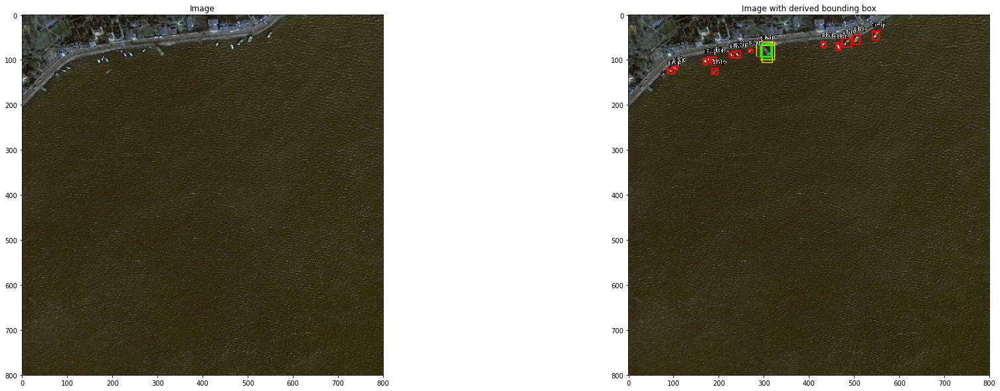

In [1]:
from debug import   parse_args, parse_anchor_parameters, read_config_file, \
                    create_generator, show_images_with_anchors, count_ignored_ships

%matplotlib inline

anchor_params = {
    'sizes':   [32, 64, 128, 256, 512],
    'strides': [8,  16, 32,  64,  128],
    'ratios':  [0.5, 1, 2],
    'scales':  [1, 1.2599210498948732, 1.5874010519681994]
}

pyramid_levels=[3, 4, 5, 6, 7]

show_images_with_anchors(anchor_params, pyramid_levels, '../data/train_v2/train.csv', '../data/bboxes_classes.csv', 10)

Ясно се вижда, че по-малките кораби не могат да бъдат засечени. Нека видим каква част от анотациите ще бъде игнорирана

In [2]:
count_ignored_ships(anchor_params, pyramid_levels, '../data/train_v2/train.csv', '../data/bboxes_classes.csv')

6999  ships ignored out of  13812


Резултатите не са никак добри... половината данни просто ще се изхвърлят, но има и по-голям проблем - всички кораби, които са по-малки от определен размер със сигурност няма да се разпознават от модела

Ще променим scales параметъра и ще добавим търсене на по-малки bounding box-ове. Също така ще добавим и ratio 0.2, за да намираме по-издължените кораби

In [8]:
anchor_params = {
    'sizes':   [16, 32, 64, 128, 256],
    'strides': [4, 8,  16, 32, 64],
    'ratios':  [0.2, 0.5, 1, 2],
    'scales':  [1, 1.2599210498948732, 1.5874010519681994]
}

pyramid_levels=[2, 3, 4, 5, 6]

count_ignored_ships(anchor_params, pyramid_levels, '../data/train_v2/train.csv', '../data/bboxes_classes.csv')

2771  ships ignored out of  13812


Получихме доста по-добри резултати.

След много опити установих, че за съжаление промяната на който и да е от параметрите sizes, strides или pyramid_levels води до получаване на точност 0 върху валидационнот множество. Затова ще променим само ratios и scales.

In [9]:
anchor_params = {
    'sizes':   [32, 64, 128, 256, 512],
    'strides': [8,  16, 32, 64, 128],
    'ratios':  [0.2, 0.5, 1, 2],
    'scales':  [0.5, 1, 1.2599210498948732]
}

pyramid_levels=[3, 4, 5, 6, 7]

count_ignored_ships(anchor_params, pyramid_levels, '../data/train_v2/train.csv', '../data/bboxes_classes.csv')

3477  ships ignored out of  13812


Да видим как изглеждат снимките с новите настройки

Image ../data/train_v2/89c428510.jpg


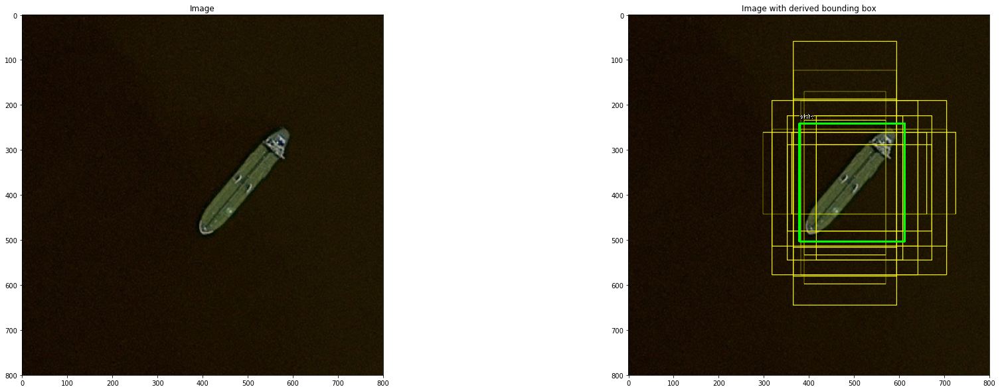

Image ../data/train_v2/aec367d77.jpg


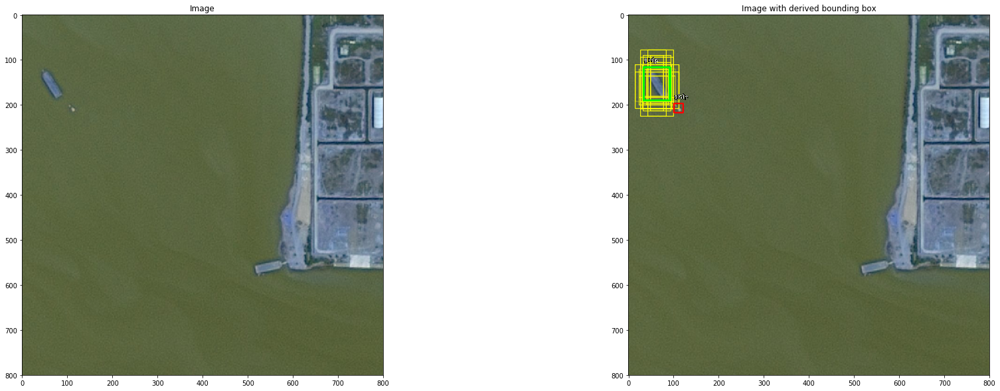

Image ../data/train_v2/9c9d84825.jpg


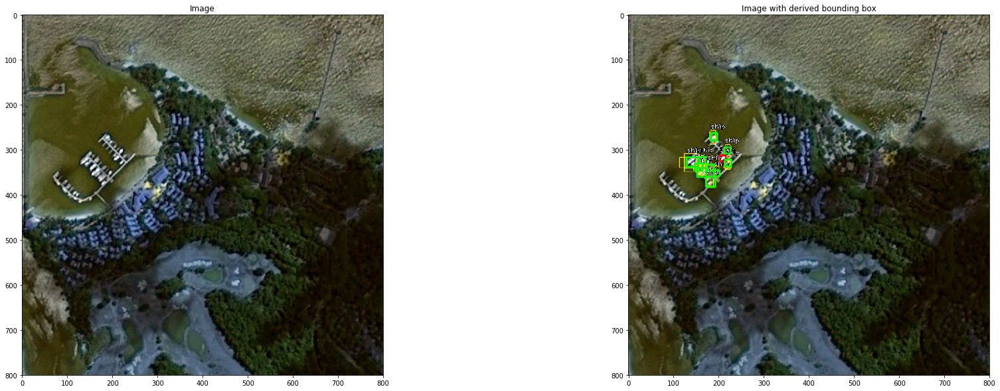

Image ../data/train_v2/07f5077e4.jpg


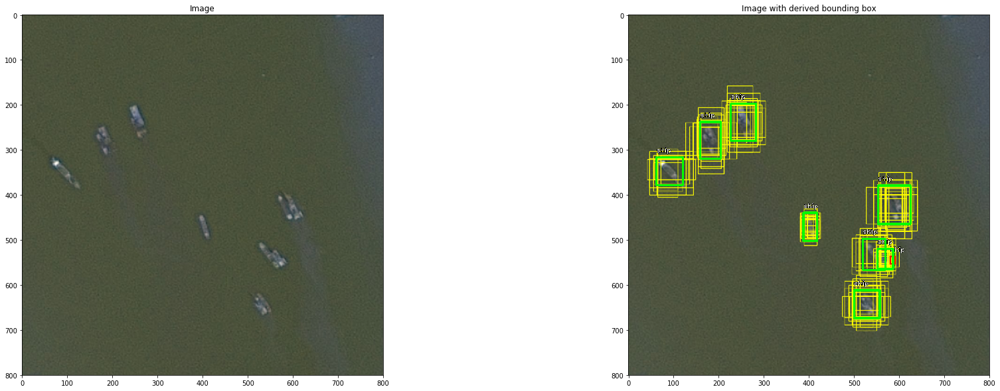

Image ../data/train_v2/4a46b4c0c.jpg


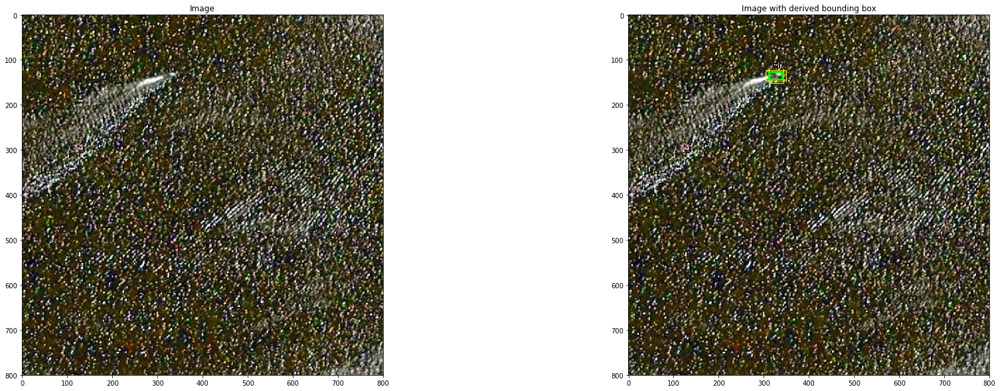

Image ../data/train_v2/559eeffea.jpg


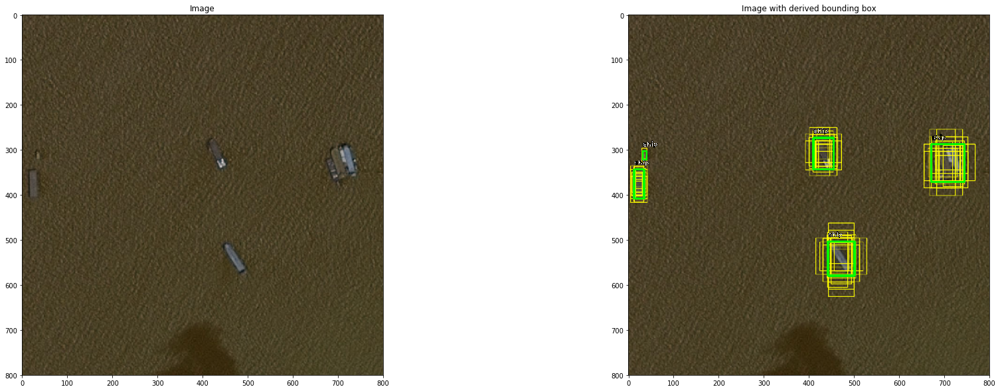

Image ../data/train_v2/c88114242.jpg


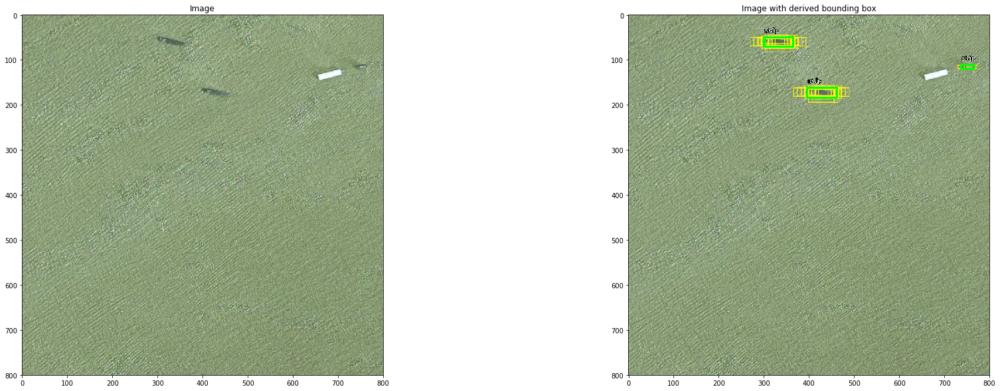

Image ../data/train_v2/c0c617b6d.jpg


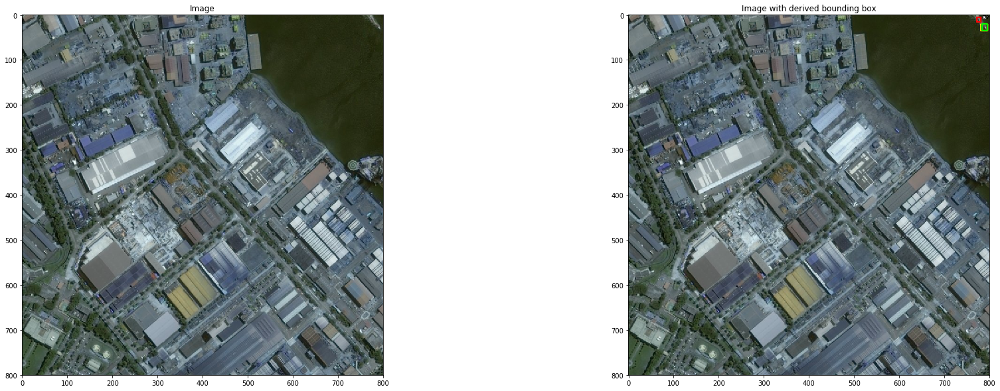

Image ../data/train_v2/c87e98339.jpg


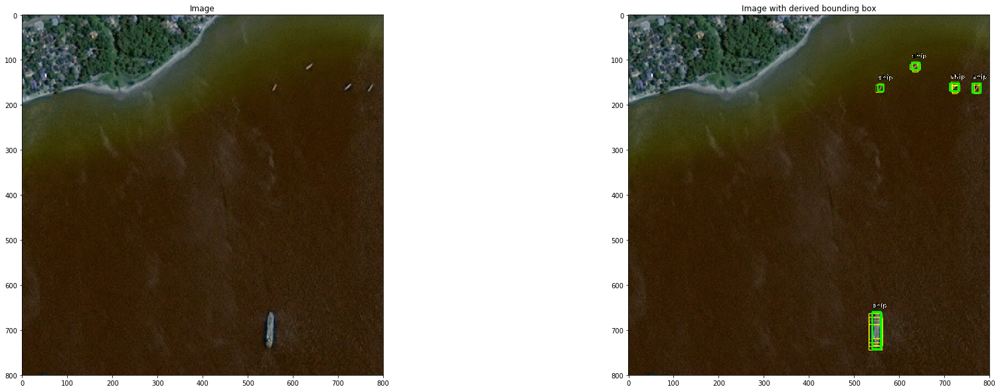

Image ../data/train_v2/3f33be256.jpg


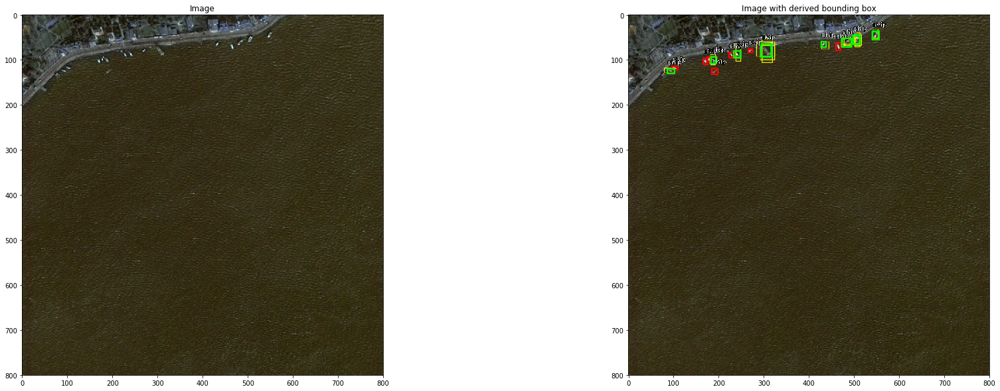

In [12]:
anchor_params = {
    'sizes':   [32, 64, 128, 256, 512],
    'strides': [8,  16, 32, 64, 128],
    'ratios':  [0.2, 0.5, 1, 2],
    'scales':  [0.5, 1, 1.2599210498948732]
}

pyramid_levels=[3, 4, 5, 6, 7]

show_images_with_anchors(anchor_params, pyramid_levels, '../data/train_v2/train.csv', '../data/bboxes_classes.csv', 10)

Все още се игнорират 1/4 от анотациите, но това е най-добрата конфигурация, която имаме за момента. В бъдеще бихме могли да разгледаме по-подробно проблема с нулевата точност, за да можем да тренираме с по-малки bounding box-ове.